In [131]:
# loading R packages
library(phyloseq)
library(plyr)
library(dplyr)
library(ggplot2)
library(vegan)
library(functional)
library(wesanderson)

In [90]:
samdat = sample_data(read.csv("../../../data/Soils_data/WBNPNWT_Soils_2015_Metadata_File_16S.txt",sep="\t",row.names=1))
# Pulling in the sample data
# Need to update 16S sample metadata.
samdat = samdat[samdat$Org_or_Min!="B",]
dim(samdat)

[1] 208 108

In [91]:
#samdat = samdat[,c(4,5,11:dim(samdat)[2])]
samdat = subset(samdat,!duplicated(samdat$Sample_ID))
row.names(samdat)=samdat$Sample_ID
dim(samdat)

[1] 102 108

In [92]:
# Importing the dataset
FactorTable = read.csv("../../../data/Soils_data/SamDat.txt",sep="\t",header=TRUE)
# Importing a dataframe with all the factors and whether or not they should be numeric
# And what set of data they belong to
head(FactorTable)

Factors,Class,Set
Barcodes,txt,seq
Sample_ID,txt,sample
Site_ID,txt,sample
Org_or_Min,txt,sample
Exch_Na_mg_kg,num,soil
Exch_Mg_mg_kg,num,soil


In [93]:
for (i in colnames(samdat)[colnames(samdat) %in%  FactorTable$Factors ]) {
        if(FactorTable$Class[FactorTable$Factors==i]=="num"){
            samdat[,i] = as.numeric(paste(data.frame(samdat[,i])[,1]))
        }
    }
# No real need to do this for full ps, as won't really be doing stats on raw data

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, e

In [94]:
colnames(samdat)

[1] "Barcodes"                   "Sample_Name"               
  [3] "Project_ID"                 "Sample_ID"                 
  [5] "Site_ID"                    "Replicate"                 
  [7] "Org_or_Min"                 "Fwd_Primer_Barcode"        
  [9] "Rev_Primer_Barcode"         "Revcomp_Rev_Primer_Barcode"
 [11] "Exch_Na_mg_kg"              "Exch_Mg_mg_kg"             
 [13] "Exch_K_mg_kg"               "Exch_Ca_mg_kg"             
 [15] "pH"                         "EC_mS_cm"                  
 [17] "CEC_cmol_kg"                "Total_N_pct"               
 [19] "Total_S_pct"                "Sand_pct"                  
 [21] "Clay_pct"                   "Silt_pct"                  
 [23] "Ca_mg_kg"                   "K_mg_kg"                   
 [25] "Mg_mg_kg"                   "Na_mg_kg"                  
 [27] "P_mg_kg"                    "S_mg_kg"                   
 [29] "Al_mg_kg"                   "Fe_mg_kg"                  
 [31] "Zn_mg_kg"                   "Cu_mg_kg"                  
 [33] "Mn_mg_kg"                   "Mo_mg_kg"                  
 [35] "TIC_ash_pct"                "TOC_LOI_pct"               
 [37] "TOC_HCL_cruc_pct"           "TC_pct"                    
 [39] "Fire_ID"                    "Ecosite"                   
 [41] "Moisture"                   "Moisture_Regime"           
 [43] "Nutrient"                   "Community"                 
 [45] "Forest"                     "Plains"                    
 [47] "Interval"                   "Veg_Comm"                  
 [49] "Land_Class_Unburned"        "Land_Class"                
 [51] "Burned_Unburned"            "Understory_CBI"            
 [53] "Overstory_CBI"              "CBI"                       
 [55] "RBR"                        "Pct_Exposed_Mineral"       
 [57] "CFSI"                       "Burn_Severity_Index"       
 [59] "Mean_Duff_Depth_cm"         "O_Depth_cm"                
 [61] "Dead_Trees"                 "Live_Trees"                
 [63] "nTrees"                     "Severity_Class"            
 [65] "temp"                       "rh"                        
 [67] "ws"                         "prec"                      
 [69] "ffmc"                       "dmc"                       
 [71] "dc"                         "isi"                       
 [73] "bui"                        "fwi"                       
 [75] "Correct_ID"                 "Number_Fires_Recorded"     
 [77] "TSLF"                       "TSO"                       
 [79] "Fires_PerYear"              "Fires_PerDecade_Recording" 
 [81] "Longest_Period_Btw_Fires"   "Shortest_Period_Btw_Fires" 
 [83] "Mean_Period_Btw_Fires"      "Reburn_Severity_Index"     
 [85] "Overstory_Dens_ha"          "Understory_Dens_ha"        
 [87] "Abs_Density_Ha_UnderOver"   "PINUBAN_Stems_Ha"          
 [89] "PICEMAR_Stems_Ha"           "PICEGLA_Stems_Ha"          
 [91] "LARILAR_Stems_Ha"           "POPUTRE_Stems_Ha"          
 [93] "POPUBAL_Stems_Ha"           "BETUPAP_Stems_Ha"          
 [95] "PINUBAN_BA_per_Ha"          "PICEMAR_BA_per_Ha"         
 [97] "PICEGLA_BA_per_Ha"          "LARILAR_BA_per_Ha"         
 [99] "POPUTRE_BA_per_Ha"          "POPUBAL_BA_per_Ha"         
[101] "BETUPAP_BA_per_Ha"          "BA_ha"                     
[103] "Pct_Conifer_Stems_lar"      "Pct_Conifer_BA_lar"        
[105] "Median_CBH"                 "Flammable_T_ha"            
[107] "Conifer_CBD"                "Surface_Severity_Class"

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 7 rows containing non-finite values (stat_bin).”

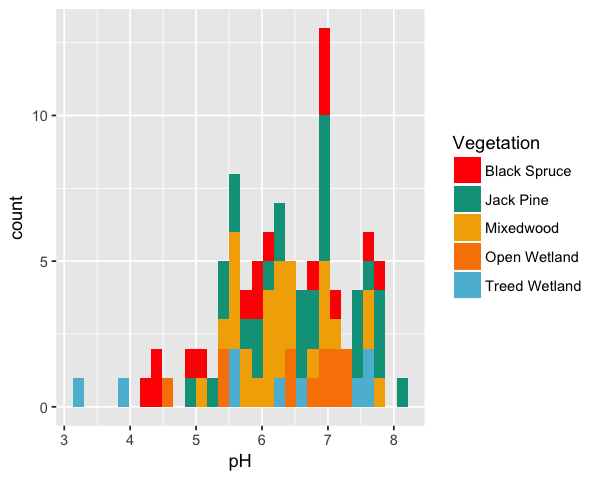

In [135]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(pH))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
#p = p + xlab(colname)
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 4 rows containing non-finite values (stat_bin).”

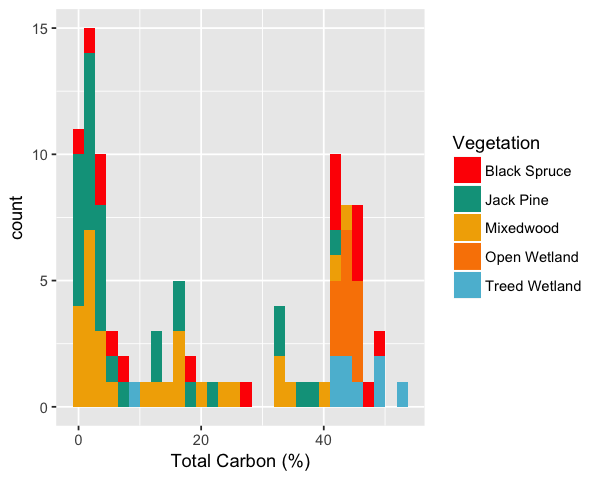

In [134]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(TC_pct))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
p = p + xlab("Total Carbon (%)")
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 4 rows containing non-finite values (stat_bin).”

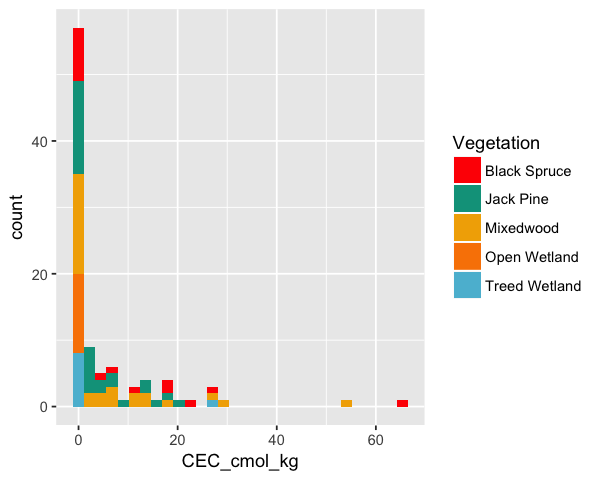

In [133]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(CEC_cmol_kg))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
#p = p + xlab("Total Carbon (%)")
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 21 rows containing non-finite values (stat_bin).”

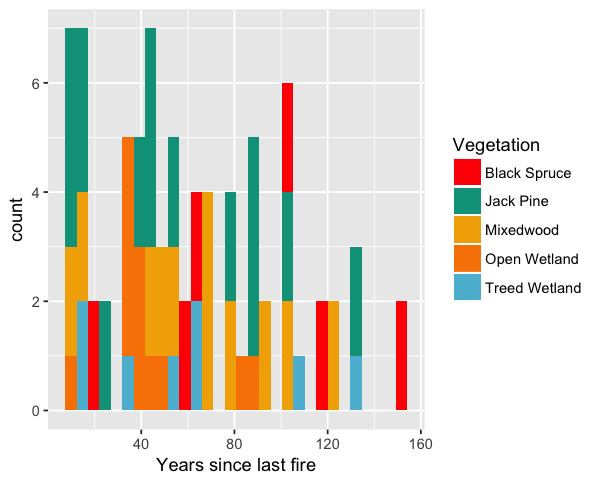

In [132]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(TSLF))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
p = p + xlab("Years since last fire")
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


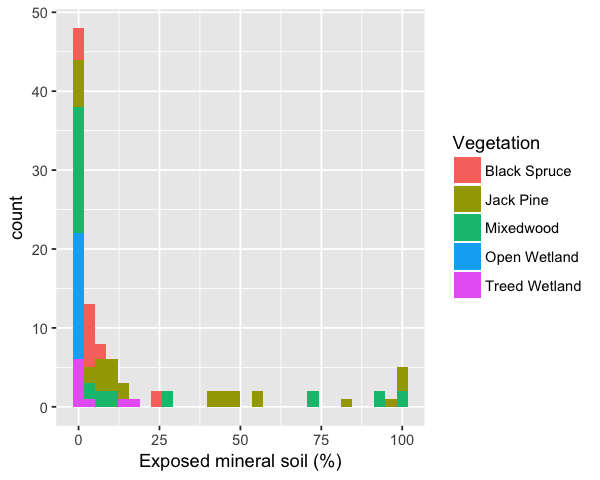

In [129]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(Pct_Exposed_Mineral))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
p = p + xlab("Exposed mineral soil (%)")
#p = p + facet_wrap(~Land_Class)
p = p + scale_color_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


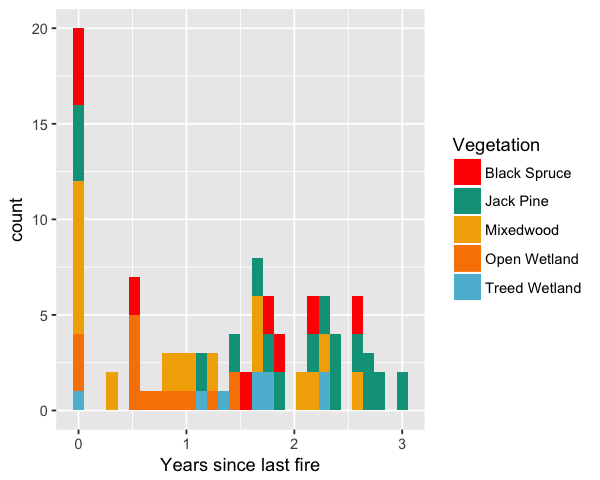

In [136]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(Understory_CBI))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
p = p + xlab("Years since last fire")
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


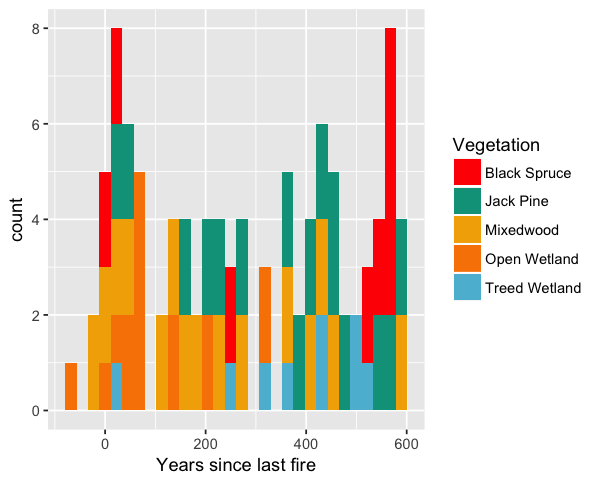

In [137]:
options(repr.plot.width=5, repr.plot.height=4)
p = ggplot(samdat,aes(RBR))
p = p + geom_histogram(aes(fill=Veg_Comm))
p = p + guides(fill=guide_legend(title="Vegetation"))
p = p + xlab("Years since last fire")
#p = p + facet_wrap(~Land_Class)
p = p + scale_fill_manual(values=wes_palette("Darjeeling"))
p

Warning message:
“Removed 21 rows containing missing values (geom_point).”

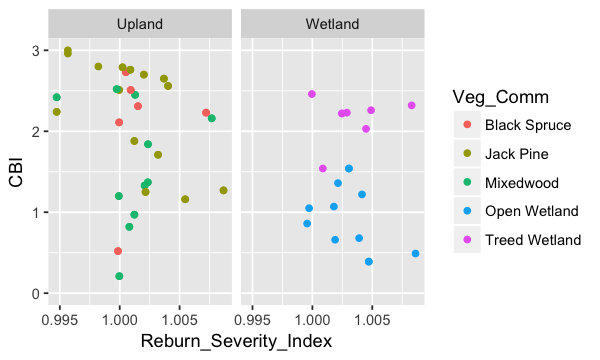

In [122]:
options(repr.plot.width=5, repr.plot.height=3)
p = ggplot(samdat,aes(x=Reburn_Severity_Index,y=CBI))
p = p + geom_point(aes(color=Veg_Comm))
#p = p + guides(fill=guide_legend(title="Vegetation"))
#p = p + xlab("Exposed mineral soil (%)")
p = p + facet_wrap(~Land_Class)
p

Warning message:
“Removed 25 rows containing missing values (geom_point).”

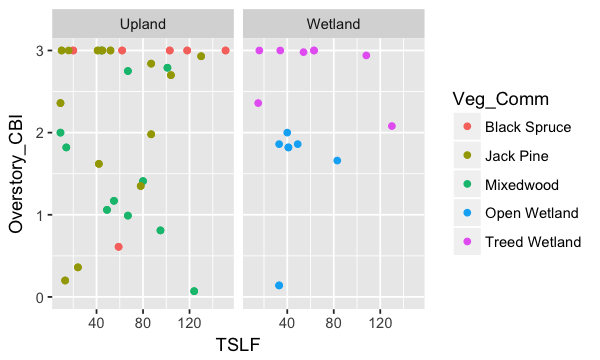

In [124]:
options(repr.plot.width=5, repr.plot.height=3)
p = ggplot(samdat,aes(x=TSLF,y=Overstory_CBI))
p = p + geom_point(aes(color=Veg_Comm))
#p = p + guides(fill=guide_legend(title="Vegetation"))
#p = p + xlab("Exposed mineral soil (%)")
p = p + facet_wrap(~Land_Class)
p

## Old approach

In [28]:
df = read.csv("../../../data/Soils_data/WBNPNWT_Soils_2015_Metadata_File_ITS.csv", header=TRUE)

In [29]:
# Importing the dataset
df = read.csv("../../../data/Soils_data/WBNPNWT_Soils_2015_Metadata_File_ITS.csv", header=TRUE)
# Import the file
df = df[df$Project_ID=="WB15",]
df = df[df$Org_or_Min %in% c("O","M"),]
df = df[,2:dim(df)[2]]
df = df[!duplicated(df$Sample_ID),]
# Get rid of the DNA sample duplicates
row.names(df)=df$Sample_ID
# Fix the rownames

In [30]:
colnames(df)

[1] "Barcodes"                   "Sample_Name"               
 [3] "Project_ID"                 "Sample_ID"                 
 [5] "Site_ID"                    "Replicate"                 
 [7] "Org_or_Min"                 "Fwd_Primer_Barcode"        
 [9] "Rev_Primer_Barcode"         "Revcomp_Rev_Primer_Barcode"
[11] "Exch_Na_mg_kg"              "Exch_Mg_mg_kg"             
[13] "Exch_K_mg_kg"               "Exch_Ca_mg_kg"             
[15] "pH"                         "EC_mS_cm"                  
[17] "CEC_cmol_kg"                "Total_N_pct"               
[19] "Total_S_pct"                "Sand_pct"                  
[21] "Clay_pct"                   "Silt_pct"                  
[23] "Ca_mg_kg"                   "K_mg_kg"                   
[25] "Mg_mg_kg"                   "Na_mg_kg"                  
[27] "P_mg_kg"                    "S_mg_kg"                   
[29] "Al_mg_kg"                   "Fe_mg_kg"                  
[31] "Zn_mg_kg"                   "Cu_mg_kg"                  
[33] "Mn_mg_kg"                   "Mo_mg_kg"                  
[35] "TIC_ash_pct"                "TOC_LOI_pct"               
[37] "TOC_HCL_cruc_pct"           "TC_pct"                    
[39] "Fire_ID"                    "Ecosite"                   
[41] "Moisture"                   "Moisture_Regime"           
[43] "Nutrient"                   "Community"                 
[45] "Forest"                     "Plains"                    
[47] "Interval"                   "Veg_Comm"                  
[49] "Land_Class_Unburned"        "Land_Class"                
[51] "Burned_Unburned"            "Understory_CBI"            
[53] "Overstory_CBI"              "CBI"                       
[55] "RBR"                        "Pct_Exposed_Mineral"       
[57] "CFSI"                       "Burn_Severity_Index"       
[59] "Mean_Duff_Depth_cm"         "O_Depth_cm"                
[61] "Dead_Trees"                 "Live_Trees"                
[63] "nTrees"                     "Severity_Class"            
[65] "temp"                       "rh"                        
[67] "ws"                         "prec"                      
[69] "ffmc"                       "dmc"                       
[71] "dc"                         "isi"                       
[73] "bui"                        "fwi"                       
[75] "Correct_ID"

In [31]:
levels(df$Burn_Severity_Index)

[1] ""            "#N/A"        "1"           "1.5375"      "1.771590909"
 [6] "1.9125"      "1.974605263" "2.0425"      "2.0875"      "2.1175"     
[11] "2.13"        "2.2075"      "2.2275"      "2.2725"      "2.375"      
[16] "2.51"        "2.775"       "2.786805556" "2.91"        "2.98"       
[21] "3.052777778" "3.09"        "3.15"        "3.175"       "3.205681818"
[26] "3.325"       "3.48"        "3.5125"      "3.53"        "3.535"      
[31] "3.5475"      "3.621710526" "3.6775"      "3.7"         "3.725"      
[36] "3.7675"      "3.794545455" "3.7975"      "3.867547847" "3.960102339"
[41] "4.125"       "4.275"       "4.35"        "4.3925"      "4.45"       
[46] "4.502105263" "4.725"       "4.815"       "4.9725"      "5"

In [32]:
Factors = colnames(df)
FactorClass = c("txt","txt","txt","txt","txt","txt","txt","txt","txt","txt","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","txt","txt","txt","num","txt","txt","num","num","txt","txt","txt","txt","txt","num","num","num","num","num","num","num","num","num","num","num","num","txt","num","num","num","num","num","num","num","num","num","num")
FactorSet = c("seq","sample","sample","sample","sample","sample","sample","seq","seq","seq","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","class","class","class","class","class","class","class","class","class","class","class","class","sample","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","codes","codes","codes","codes","codes","codes","codes","codes","codes","codes")
FactorTable = data.frame(Factors=Factors,Class=FactorClass,Set=FactorSet)
# Creating a dataframe with all the factors and whether or not they should be numeric
# And what set of data they belong to
FactorTable[1:20,]

ERROR: Error in data.frame(Factors = Factors, Class = FactorClass, Set = FactorSet): arguments imply differing number of rows: 75, 74


In [11]:
length(FactorSet)

[1] 74

In [7]:
### Selecting only numeric properties
df.numeric = df
for (i in 1:length(colnames(df))) {
        if(FactorTable$Class[FactorTable$Factors==colnames(df)[i]]=="num"){
            df.numeric[,i] = as.numeric(paste(df[,i]))
        }
}
# Converts all the factors to numeric data
row.names(df.numeric)=row.names(df)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, e

In [18]:
# Filter the samples that are mineral or organic (otherwise all NA)

Org_or_Min = "O"    # Options are "O" or "M"
Dataset = "soil"    # Options are: 'class' 'codes' 'sample' 'seq' 'severity' 'soil'

# Adjusting the dataset so the unburned samples aren't included in burn data
Burned_Unburned = c("Burned")
if (Dataset=="soil"){
    Burned_Unburned = c("Burned","Unburned")
}

# Need this command for the mineral samples, which have, like 3 values for this
df.ord = df.numeric
if (Org_or_Min=="M"){
    df.ord = df.numeric[,colnames(df.numeric)!="TOC_HCL_cruc_pct"]
}

# Need this command for the "codes" or "severity" samples, which have no data for unburned
df.ord = df.ord[df.ord$Org_or_Min==Org_or_Min & df.ord$Burned_Unburned %in% Burned_Unburned,]

# Get only the numeric values
df.ord = df.ord[,colnames(df.ord) %in% FactorTable$Factors[FactorTable$Class == "num"]]



# Select only the factors for the selected dataset
df.ord = df.ord[,colnames(df.ord) %in% FactorTable$Factors[FactorTable$Set == Dataset]]


# Find the columns that have all NAs for numerics
ColsAllNA = c()
for (i in 1:dim(df.ord)[2]){
    ColsAllNA[i]=all(is.na(df.ord[,i]))
}
# Remove cols with all NAs
df.ord = df.ord[,!ColsAllNA]
#df.ord = df.ord[,colSums(df.ord)]

In [9]:
### Ordination (PCA)
ord = prcomp(df.numeric, scale=FALSE)

ERROR: Error in colMeans(x, na.rm = TRUE): 'x' must be numeric


In [21]:
options(repr.plot.width=10, repr.plot.height=10)

### Plot the ordination
PCbiplot <- function(PC, x="PC1", y="PC2") {
    # Plotting points
    data = data.frame(obsnames=row.names(PC$x), PC$x, df[match(rownames(PC$x), rownames(df)),])
    obsnames = row.names(PC$x)
    p = ggplot(data, aes(x=PC1, y=PC2)) + geom_point(alpha=.8, size=3, aes(color=Veg_Comm)) + geom_text(label=obsnames,size=4)
    p = p + geom_hline(yintercept=0, size=.2) + geom_vline(xintercept=0, size=.2)
    
    # Adding arrows
    datapc = data.frame(varnames=rownames(PC$rotation), PC$rotation)
    mult = min(
        (max(data[,y]) - min(data[,y])/(max(datapc[,y])-min(datapc[,y]))),
        (max(data[,x]) - min(data[,x])/(max(datapc[,x])-min(datapc[,x])))
        )
    datapc = transform(datapc,
            v1 = .7 * mult * (get(y)),
            v2 = .7 * mult * (get(x))
            )
    p = p + coord_equal() + geom_text(data=datapc, aes(x=-v1, y=-v2, label=varnames), size = 4, vjust=1, color="black")
    p = p + geom_segment(data=datapc, aes(x=0, y=0, xend=-v1, yend=-v2), arrow=arrow(length=unit(0.2,"cm")), alpha=0.75, color="darkgrey")
    
    # Adding axis labels
    var = PC$sdev^2 / sum(PC$sdev^2)
    p = p + xlab(paste("PC1 (",round(var[1]*100,1),"%)",sep=""))
    p = p + ylab(paste("PC2 (",round(var[2]*100,1),"%)",sep=""))
    
    p
}

PCbiplot(ord)

ERROR: Error in row.names(PC$x): object 'ord' not found


In [48]:
df.numeric$High_alpha = ifelse(rownames(df.numeric)=="15S-NT-41M",1,0)
df.numeric[df.numeric$High_alpha==1,]

,Barcodes,Sample_Name,Project_ID,Sample_ID,Site_ID,Replicate,Org_or_Min,Fwd_Primer_Barcode,Rev_Primer_Barcode,Revcomp_Rev_Primer_Barcode,⋯,rh,ws,prec,ffmc,dmc,dc,isi,bui,fwi,High_alpha
15S-NT-41M,AACGCTGAACGACGTG,15S-NT-41M-1,WB15,15S-NT-41M,15S-NT-41,1,M,ACGACGTG,TCAGCGTT,AACGCTGA,⋯,39.08812,11.73044,0.2848249,88.60529,82.11142,544.2604,6.338425,119.2466,24.94835,1


In [51]:
SoilsDataPlotter = function(colname){
    df = data.frame(Sample_ID=df.numeric[,colnames(df.numeric) == "Sample_ID"],Y=df.numeric[,colnames(df.numeric)==colname],High_alpha=df.numeric[,colnames(df.numeric)=="High_alpha"])
    df = df[order(df$Y),]
    df$Sample_ID = ordered(df$Sample_ID,levels=c(paste(df$Sample_ID)))
    p = ggplot(df,aes(x=Sample_ID, y=Y, colour=High_alpha))
    p = p + geom_point(size=3)
    p = p + theme(axis.text.x = element_text(angle=45,hjust=1, size=10))
    p = p + ylab(colname)
    print(p)
}

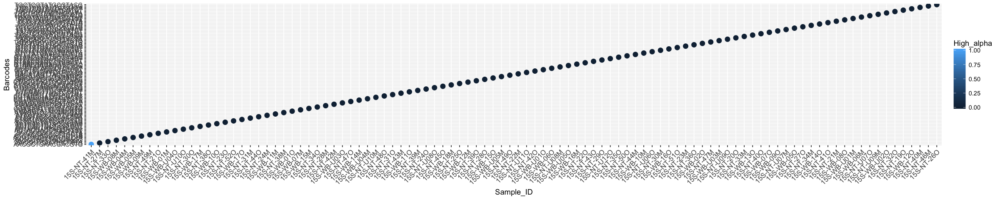

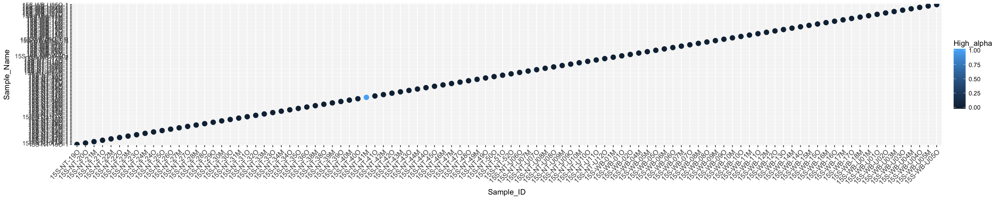

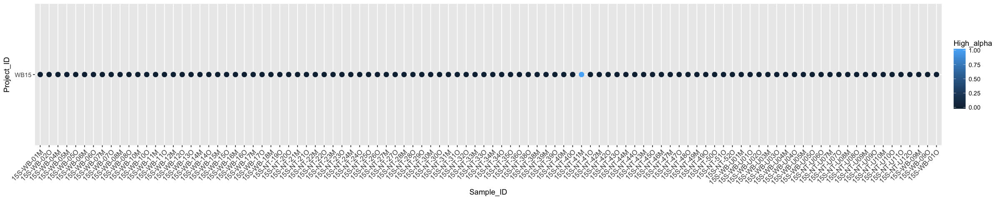

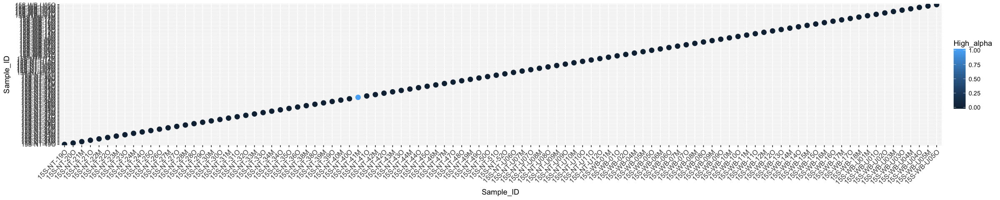

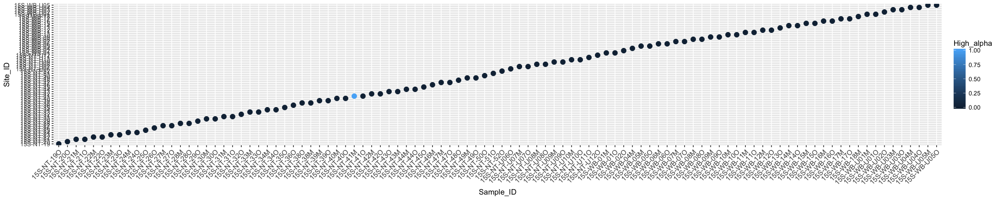

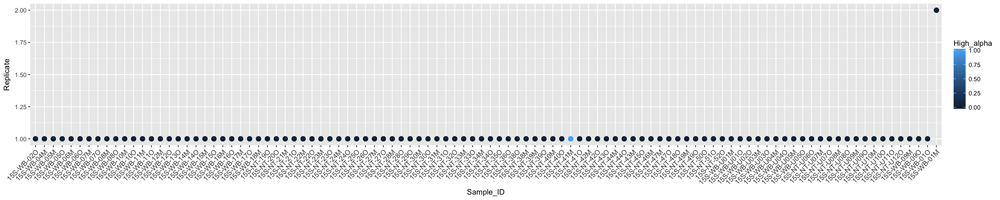

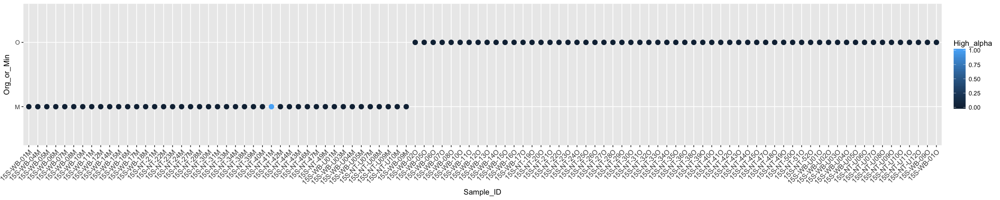

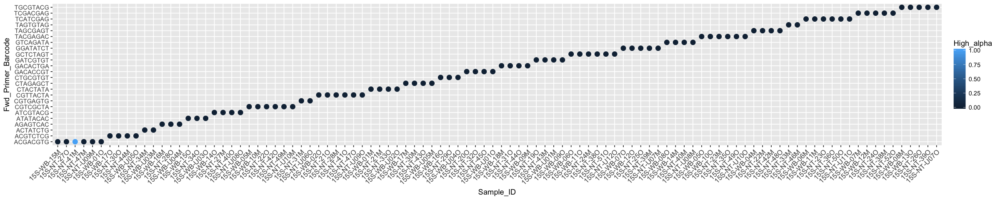

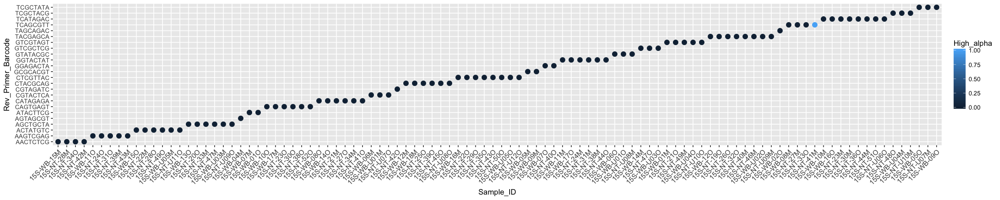

Warning message:
“Removed 4 rows containing missing values (geom_point).”

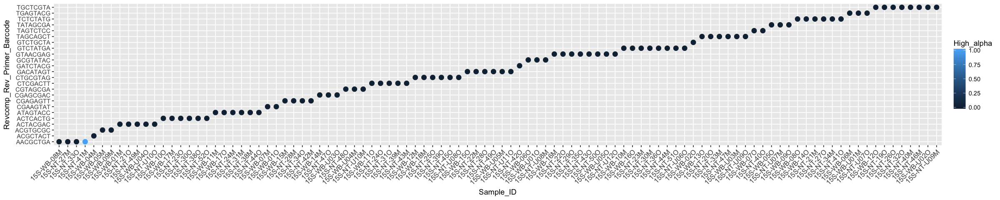

Warning message:
“Removed 4 rows containing missing values (geom_point).”

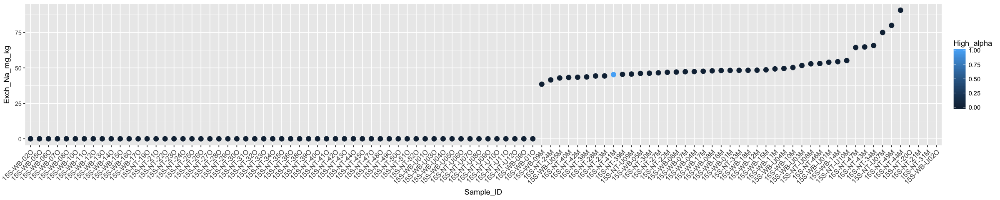

Warning message:
“Removed 4 rows containing missing values (geom_point).”

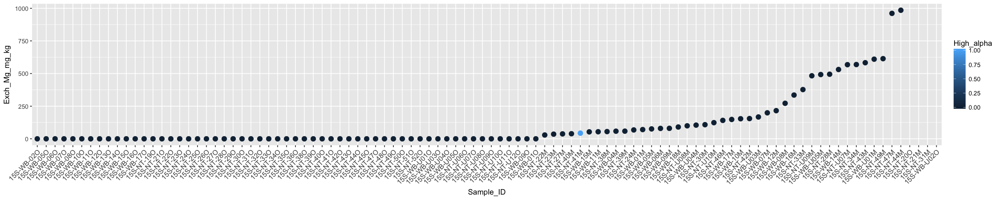

Warning message:
“Removed 4 rows containing missing values (geom_point).”

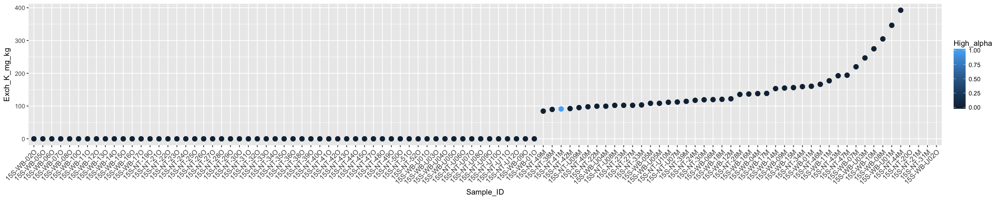

Warning message:
“Removed 4 rows containing missing values (geom_point).”

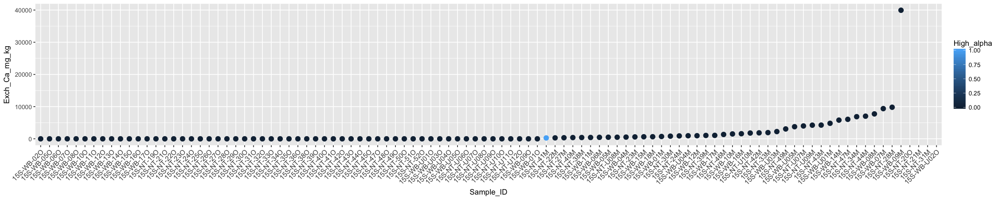

Warning message:
“Removed 4 rows containing missing values (geom_point).”

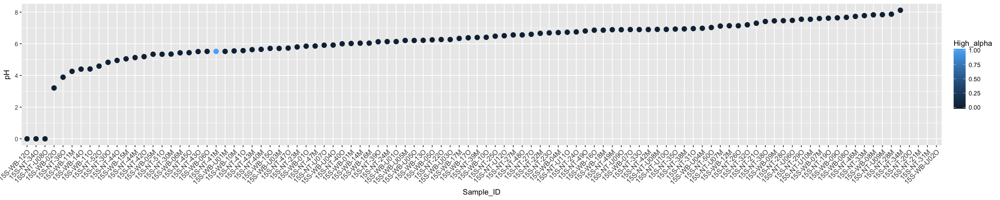

Warning message:
“Removed 4 rows containing missing values (geom_point).”

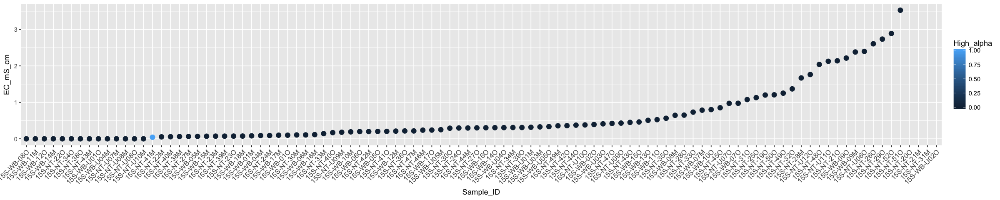

Warning message:
“Removed 4 rows containing missing values (geom_point).”

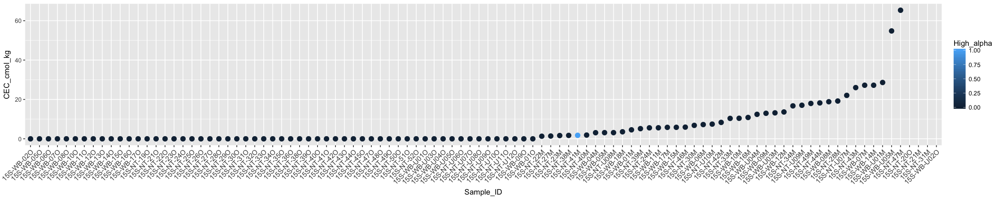

Warning message:
“Removed 4 rows containing missing values (geom_point).”

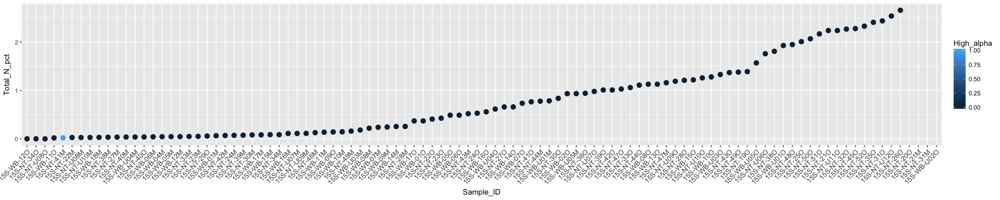

Warning message:
“Removed 4 rows containing missing values (geom_point).”

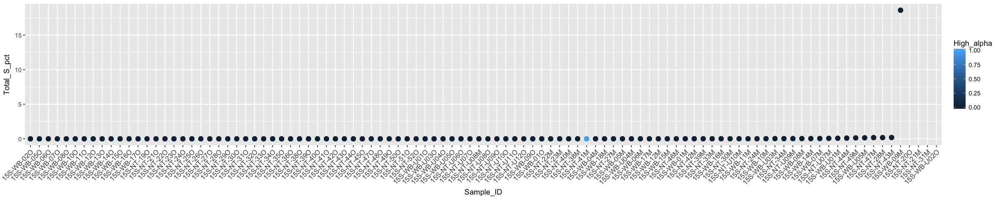

Warning message:
“Removed 4 rows containing missing values (geom_point).”

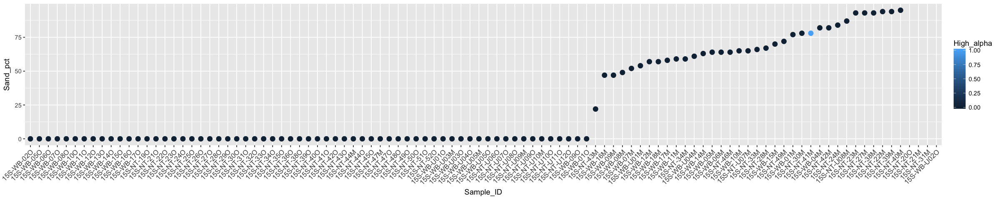

Warning message:
“Removed 4 rows containing missing values (geom_point).”

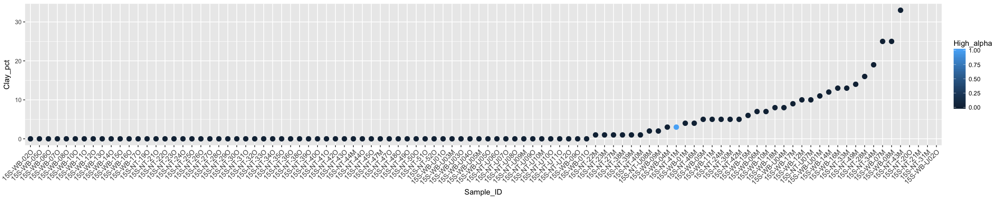

Warning message:
“Removed 4 rows containing missing values (geom_point).”

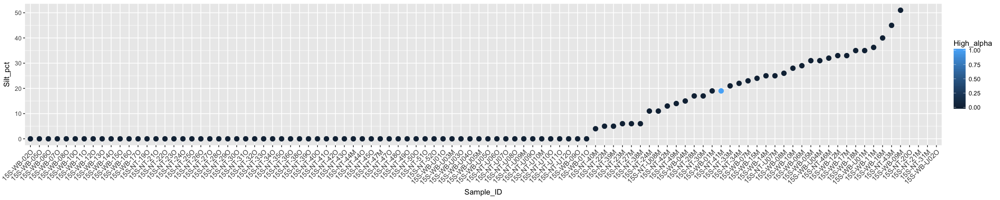

Warning message:
“Removed 4 rows containing missing values (geom_point).”

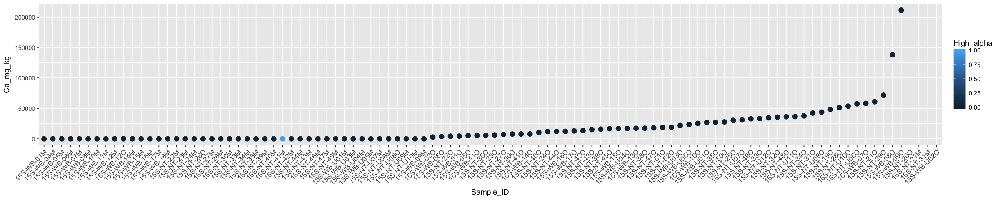

Warning message:
“Removed 4 rows containing missing values (geom_point).”

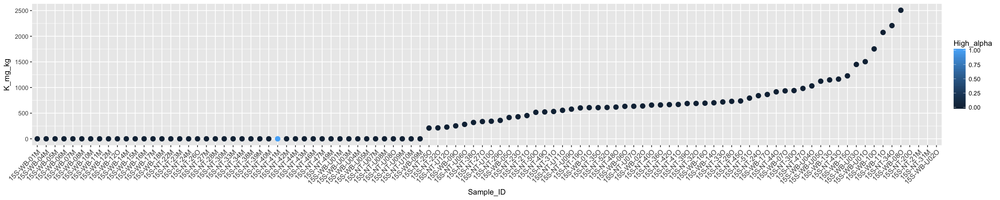

Warning message:
“Removed 4 rows containing missing values (geom_point).”

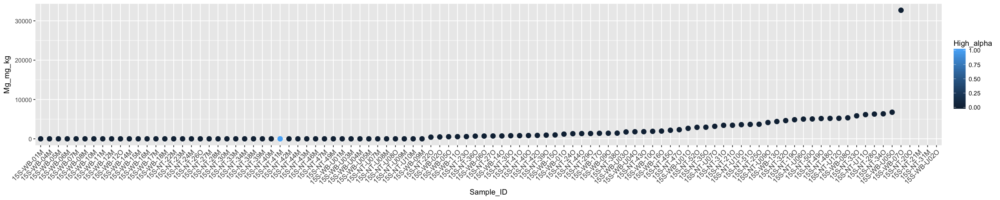

Warning message:
“Removed 4 rows containing missing values (geom_point).”

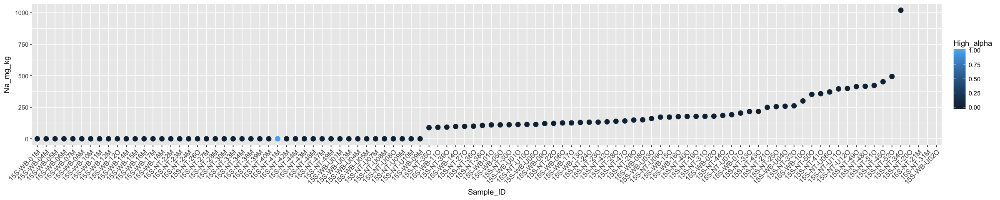

Warning message:
“Removed 5 rows containing missing values (geom_point).”

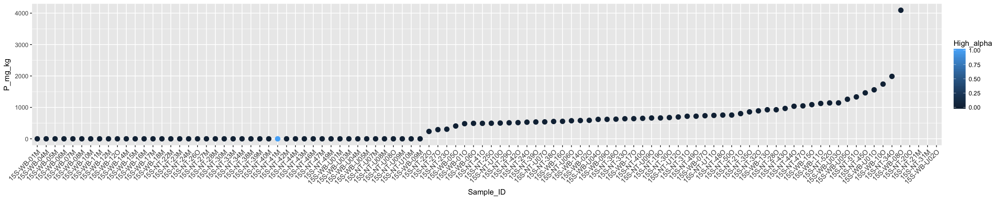

Warning message:
“Removed 4 rows containing missing values (geom_point).”

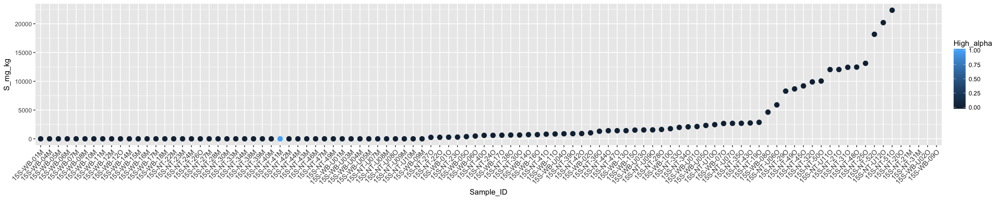

Warning message:
“Removed 4 rows containing missing values (geom_point).”

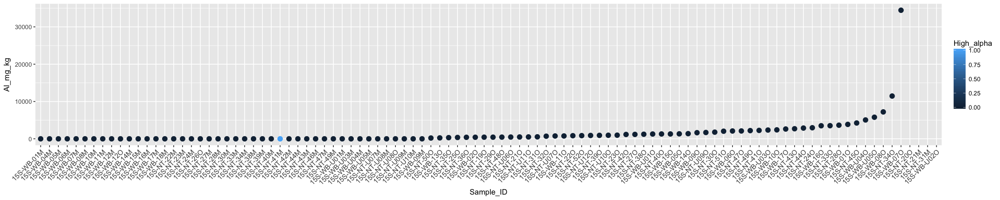

Warning message:
“Removed 34 rows containing missing values (geom_point).”

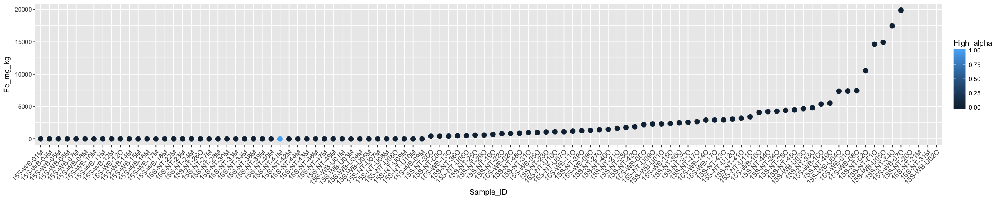

Warning message:
“Removed 4 rows containing missing values (geom_point).”

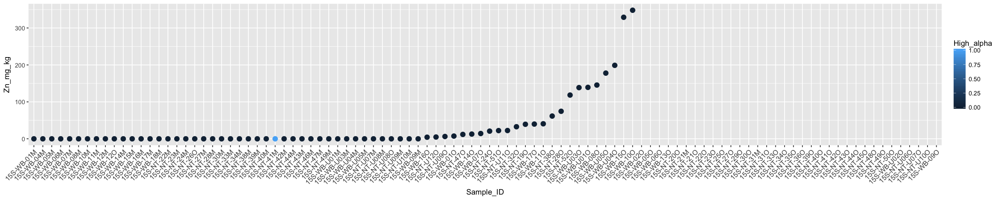

Warning message:
“Removed 4 rows containing missing values (geom_point).”

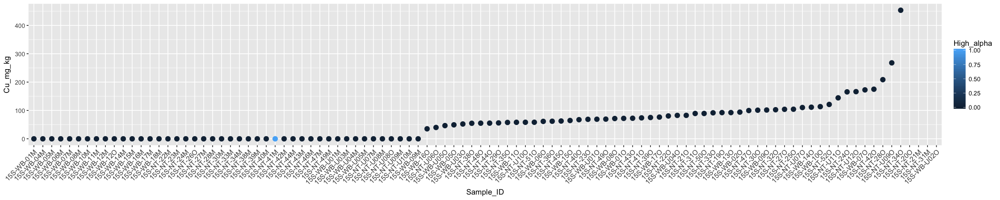

Warning message:
“Removed 4 rows containing missing values (geom_point).”

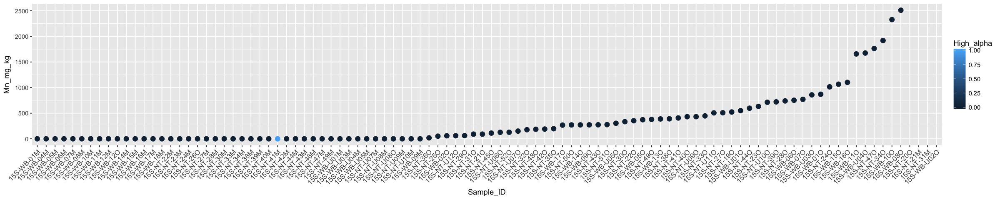

Warning message:
“Removed 4 rows containing missing values (geom_point).”

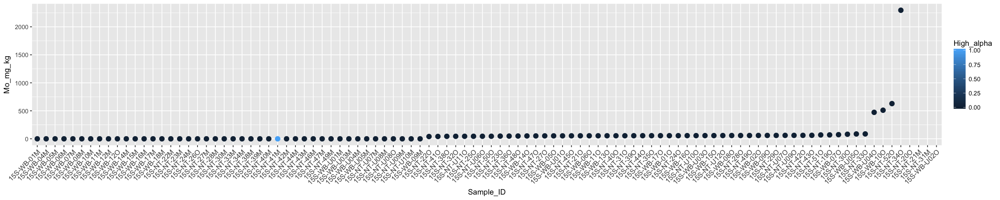

Warning message:
“Removed 4 rows containing missing values (geom_point).”

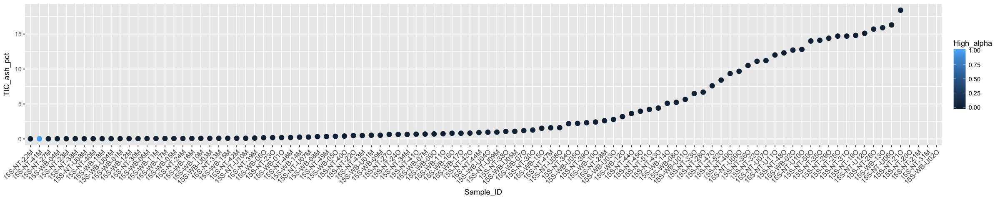

Warning message:
“Removed 4 rows containing missing values (geom_point).”

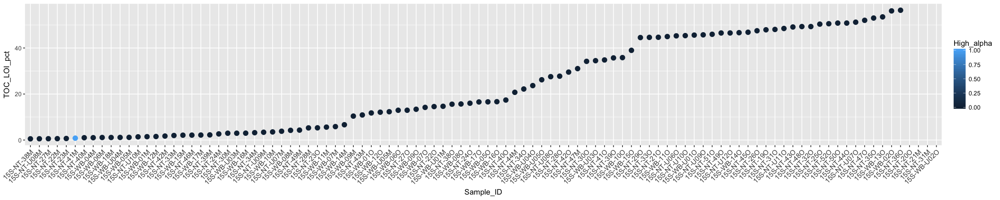

Warning message:
“Removed 4 rows containing missing values (geom_point).”

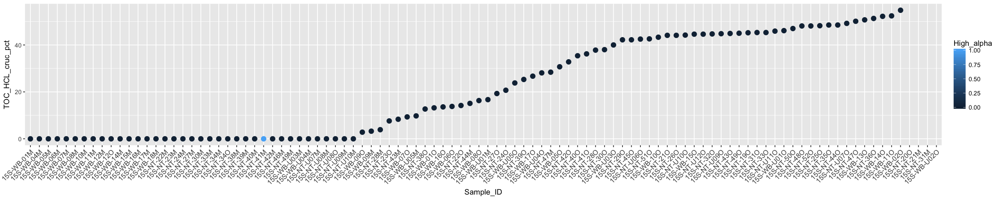

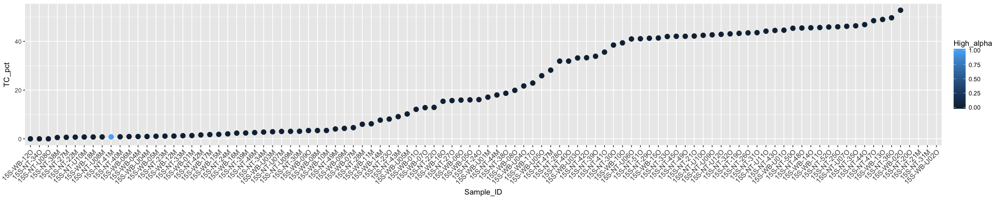

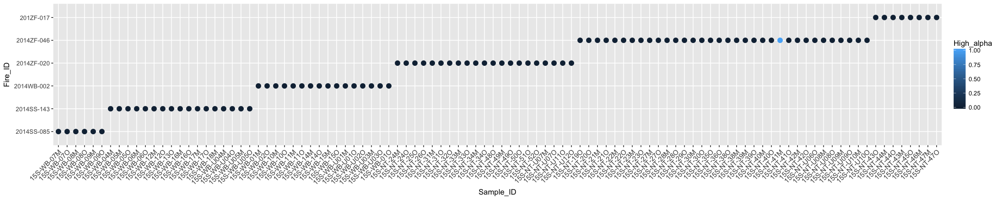

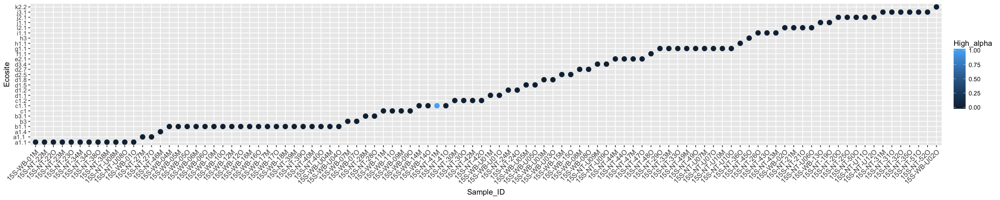

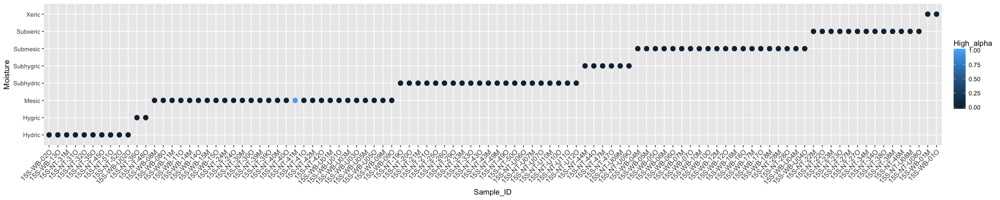

...

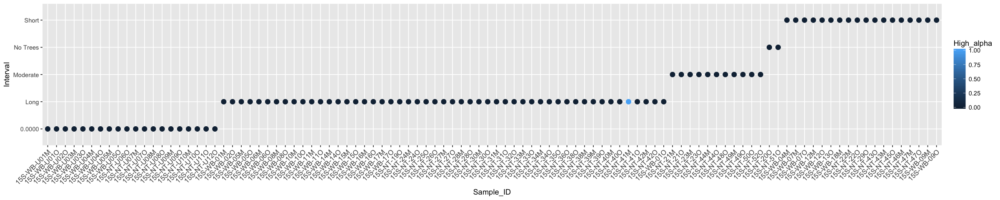

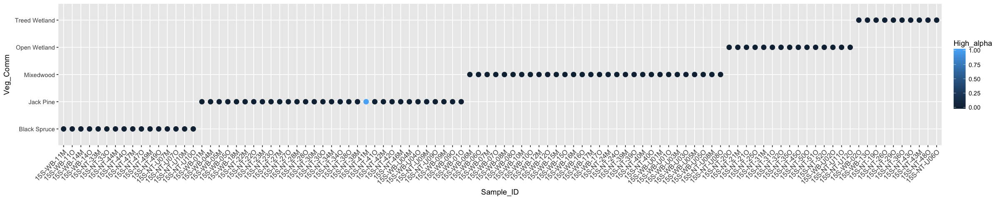

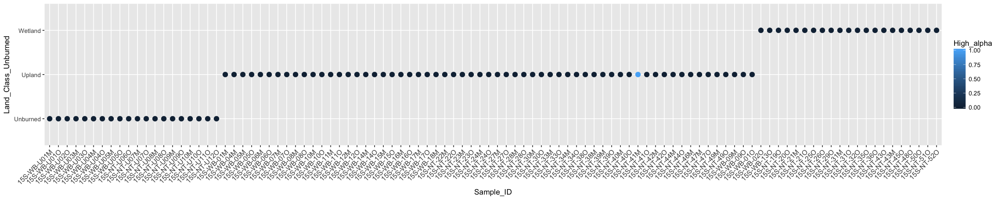

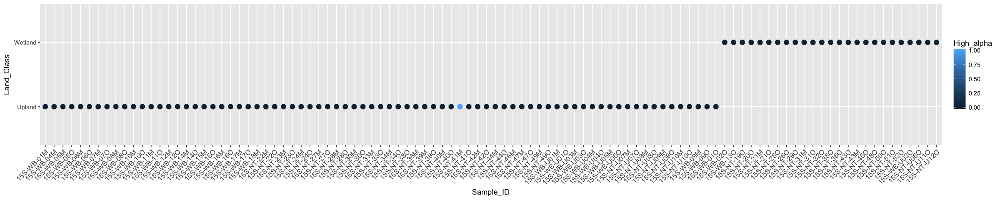

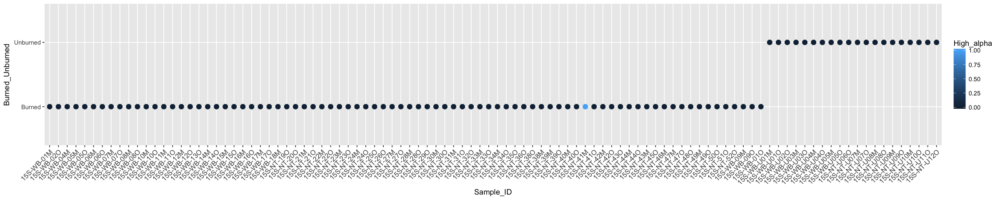

Warning message:
“Removed 5 rows containing missing values (geom_point).”

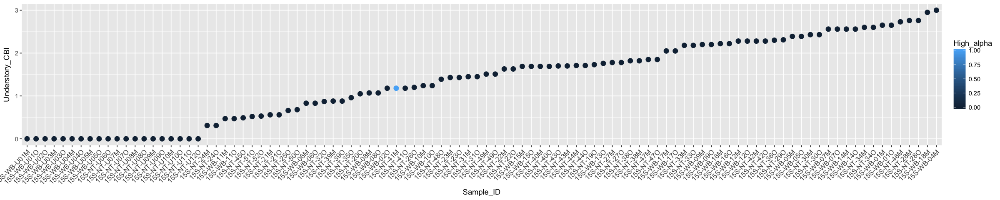

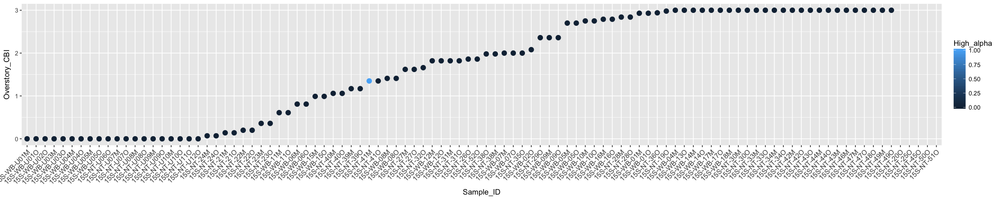

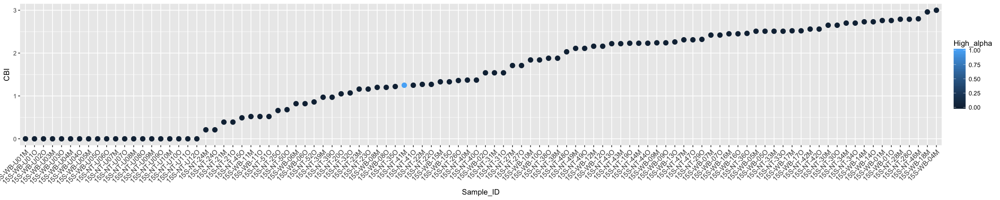

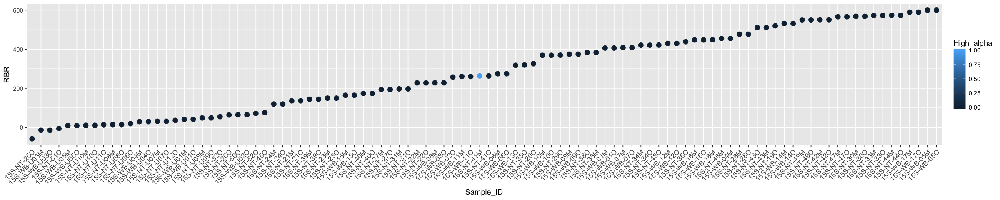

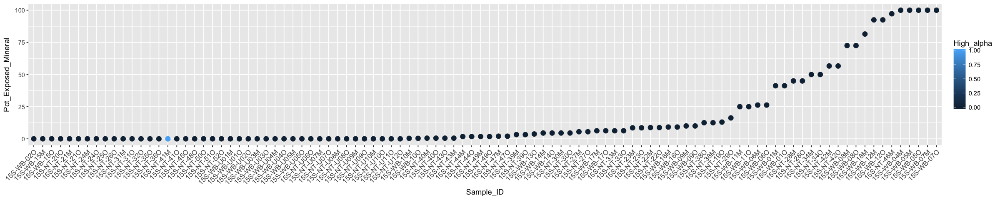

...

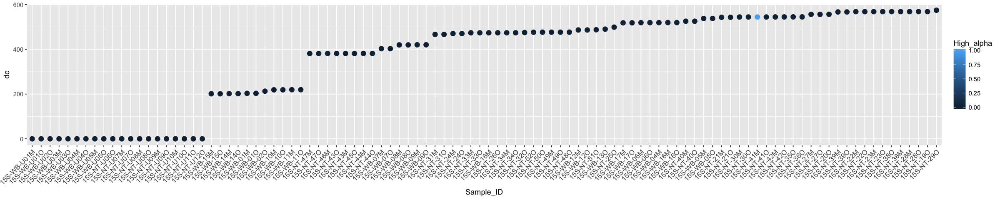

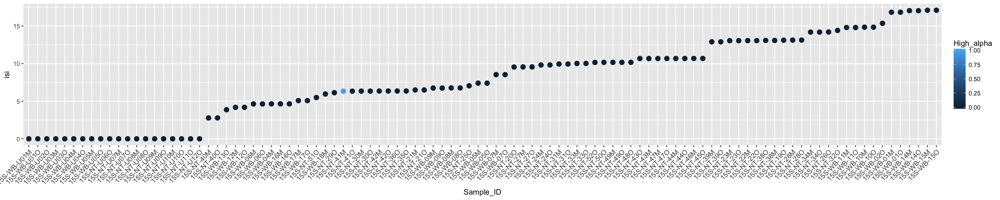

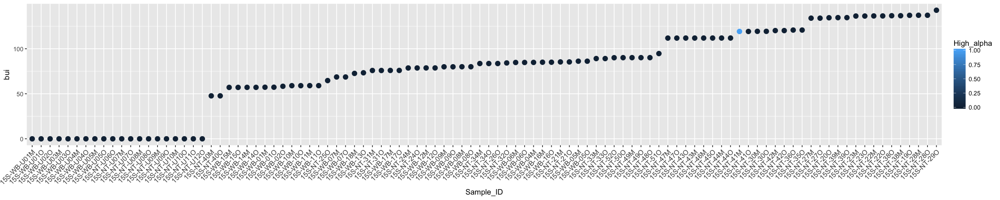

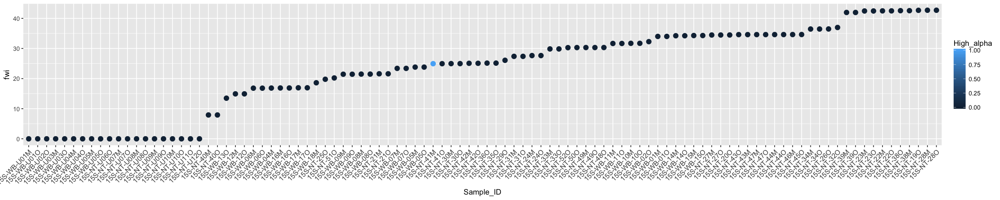

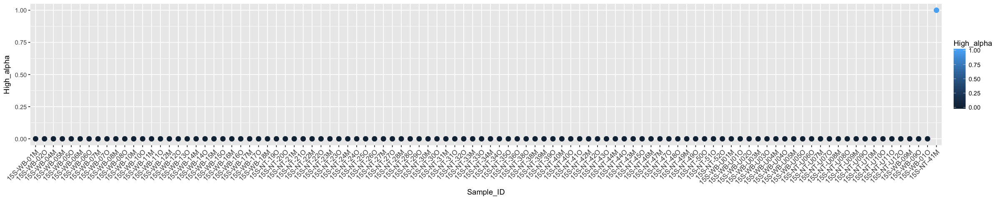

In [52]:
options(repr.plot.width=20, repr.plot.height=4)
for (i in colnames(df.numeric)){
    SoilsDataPlotter(i)
}

In [15]:
head(df.numeric)

,Barcodes,Sample_Name,Project_ID,Sample_ID,Site_ID,Replicate,Org_or_Min,Fwd_Primer_Barcode,Rev_Primer_Barcode,Revcomp_Rev_Primer_Barcode,⋯,temp,rh,ws,prec,ffmc,dmc,dc,isi,bui,fwi
15S-WB-01M,ACTACGACCTACTATA,15S-WB-01M-2,WB15,15S-WB-01M,15S-WB-01,2,M,CTACTATA,GTCGTAGT,ACTACGAC,⋯,25.21956,27.51104,18.197859,0.000014100,93.18206,44.24901,203.1472,16.839629,57.29720,34.00040
15S-WB-02O,GTCTGCTACGTTACTA,15S-WB-02O-1,WB15,15S-WB-02O,15S-WB-02,1,O,CGTTACTA,TAGCAGAC,GTCTGCTA,⋯,25.39108,27.40527,17.528941,0.000000036,92.76753,44.38643,212.8187,15.362831,58.34901,32.26644
15S-WB-04M,ACGCTACTTAGCGAGT,15S-WB-04M-1,WB15,15S-WB-04M,15S-WB-04,1,M,TAGCGAGT,AGTAGCGT,ACGCTACT,⋯,27.21312,39.67155,2.916274,0.001701335,89.54121,53.33275,519.1260,4.649799,84.86807,16.85402
15S-WB-05M,ACGTGCGCCGTCGCTA,15S-WB-05M-1,WB15,15S-WB-05M,15S-WB-05,1,M,CGTCGCTA,GCGCACGT,ACGTGCGC,⋯,26.97829,46.50715,8.421213,0.002194329,90.85308,53.91227,537.6140,7.403469,86.21125,23.80787
15S-WB-05O,TATAGCGATACGAGAC,15S-WB-05O-1,WB15,15S-WB-05O,15S-WB-05,1,O,TACGAGAC,TCGCTATA,TATAGCGA,⋯,26.97829,46.50715,8.421213,0.002194329,90.85308,53.91227,537.6140,7.403469,86.21125,23.80787
15S-WB-06M,TGAGTACGTCATCGAG,15S-WB-06M-1,WB15,15S-WB-06M,15S-WB-06,1,M,TCATCGAG,CGTACTCA,TGAGTACG,⋯,27.19137,39.71558,2.908715,0.001680446,89.52708,53.28272,518.9772,4.638616,84.79974,16.81612


In [16]:
SoilsDataPlotterHist = function(colname){
    df = data.frame(Org_or_Min=df.numeric[,colnames(df.numeric) == "Org_or_Min"],Y=df.numeric[,colnames(df.numeric)==colname])
    p = ggplot(df,aes(Y))
    p = p + geom_histogram(stat="bin", aes(fill=Org_or_Min), position="stack", binwidth=)
    p = p + xlab(colname)
    print(p)
}

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”

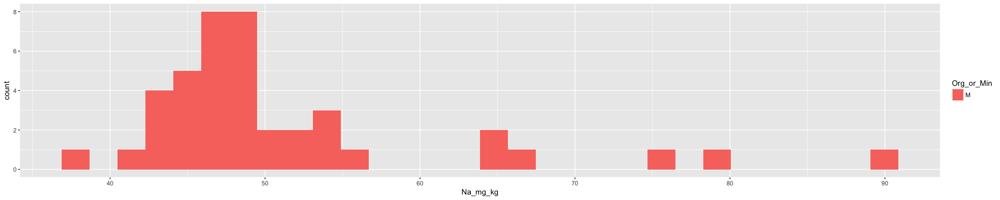

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”

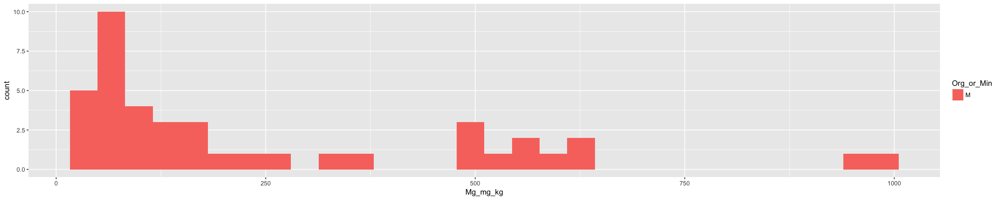

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”

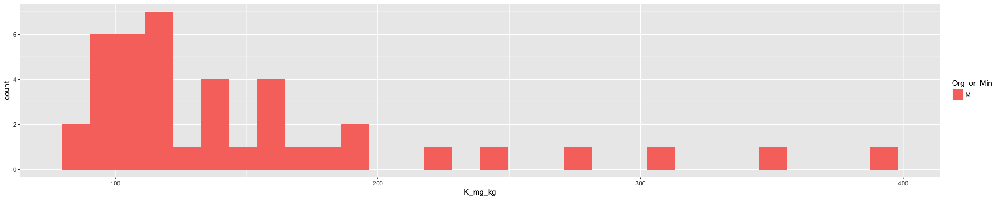

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 7 rows containing non-finite values (stat_bin).”

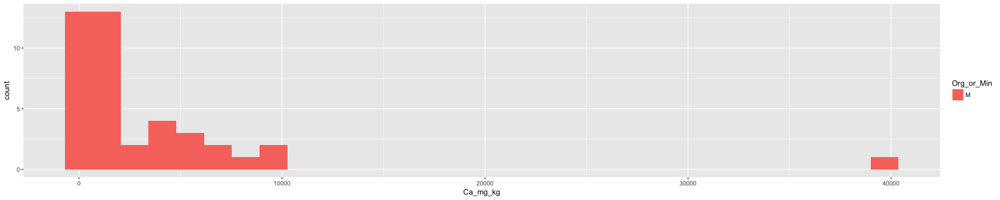

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 18 rows containing non-finite values (stat_bin).”

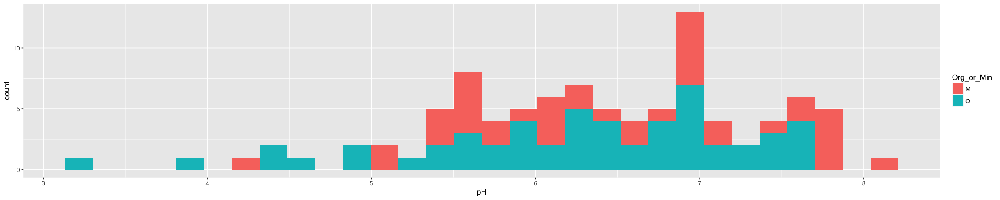

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”

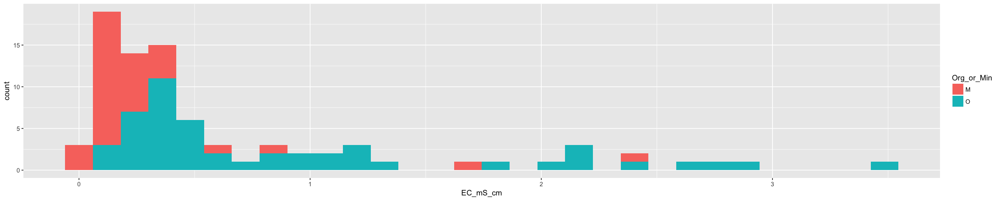

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 7 rows containing non-finite values (stat_bin).”

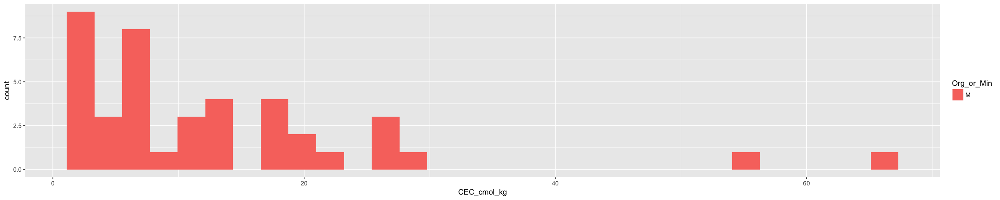

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 61 rows containing non-finite values (stat_bin).”

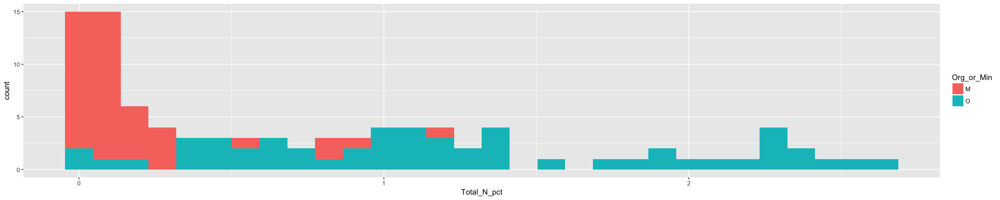

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 67 rows containing non-finite values (stat_bin).”

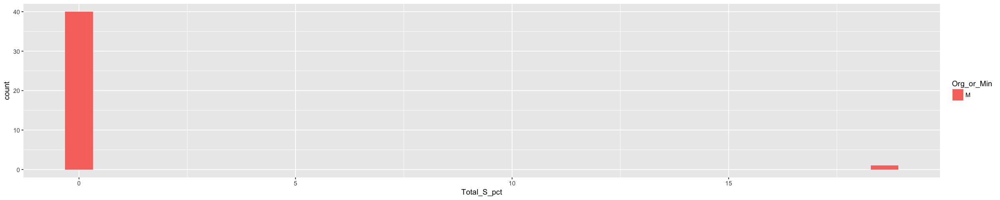

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 67 rows containing non-finite values (stat_bin).”

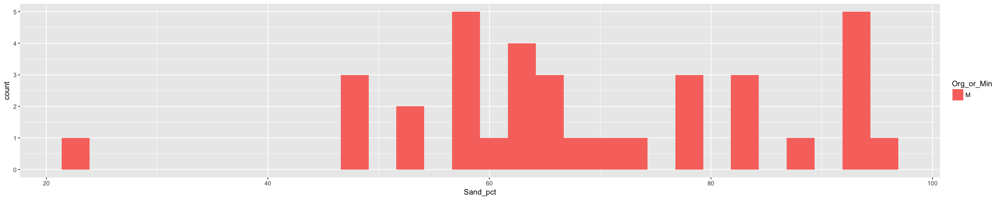

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 67 rows containing non-finite values (stat_bin).”

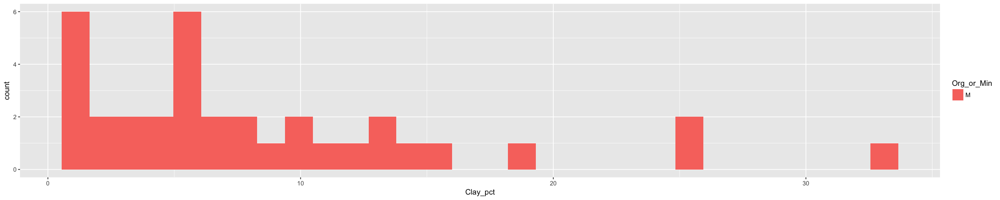

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

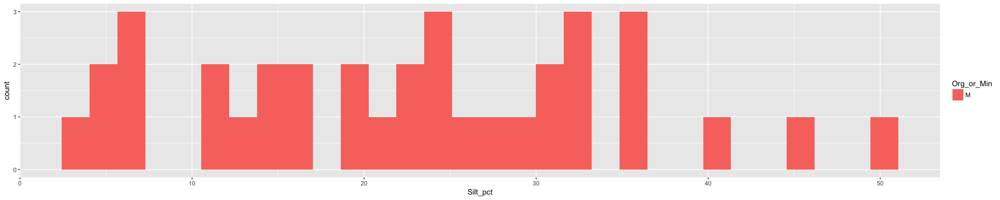

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

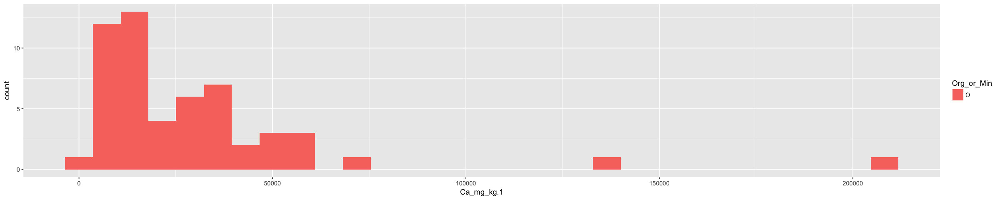

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

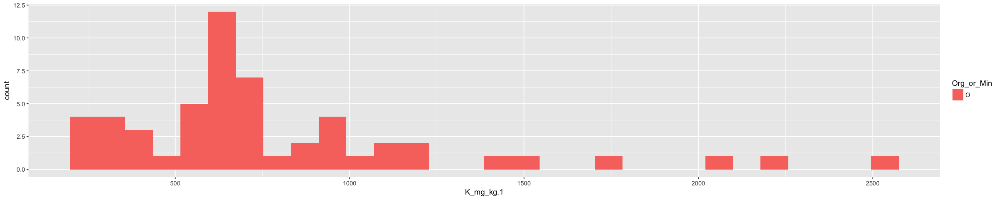

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

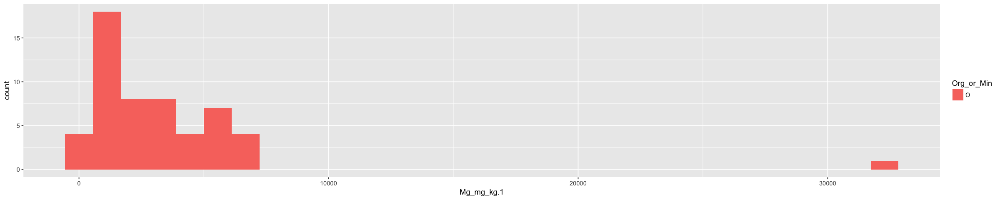

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

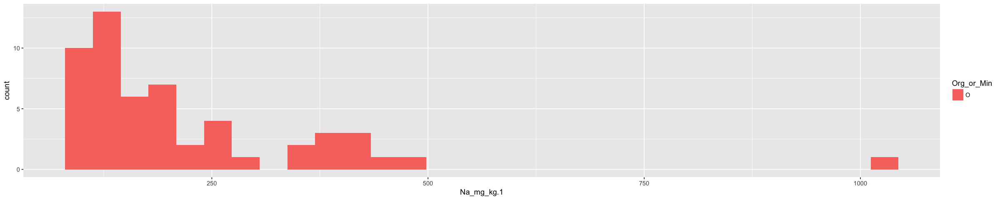

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 49 rows containing non-finite values (stat_bin).”

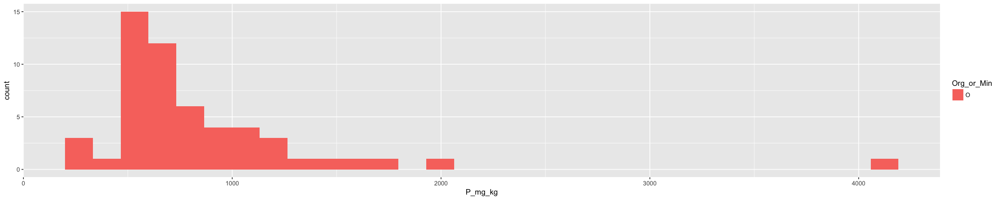

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

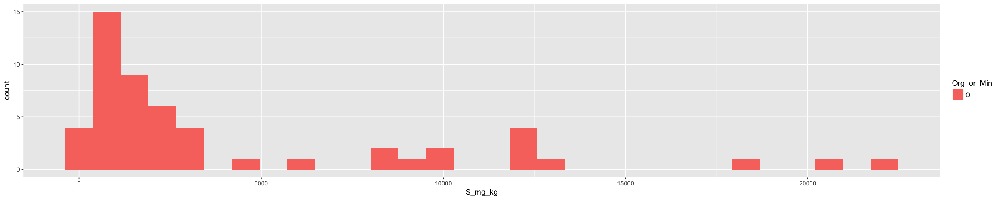

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

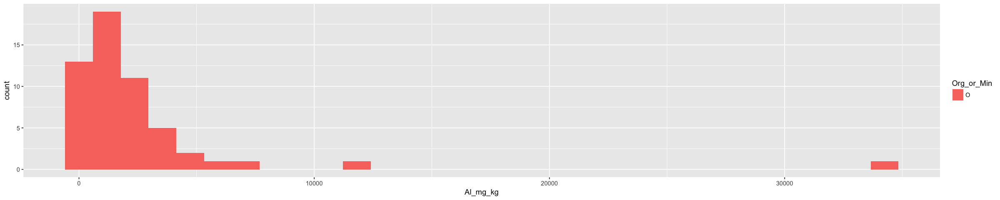

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 78 rows containing non-finite values (stat_bin).”

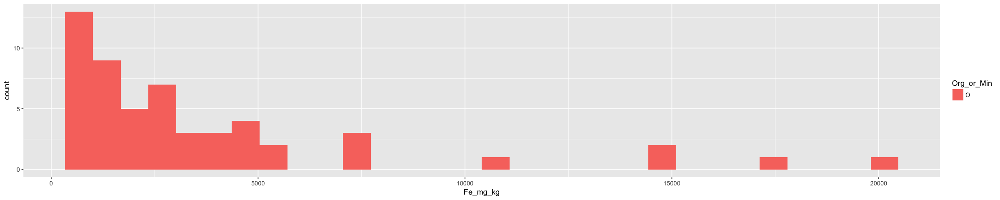

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

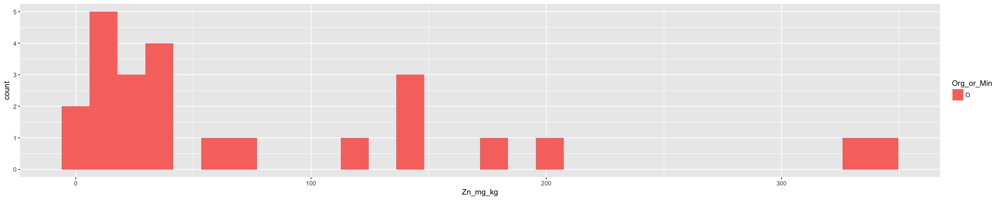

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

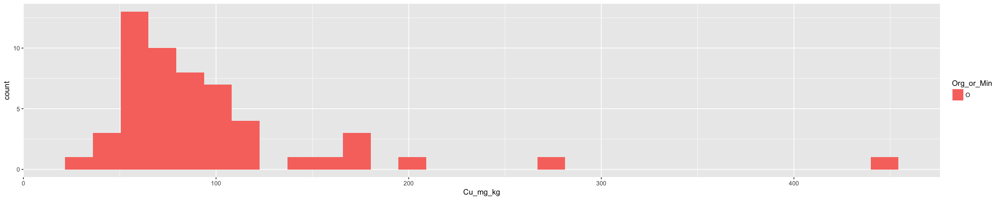

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 48 rows containing non-finite values (stat_bin).”

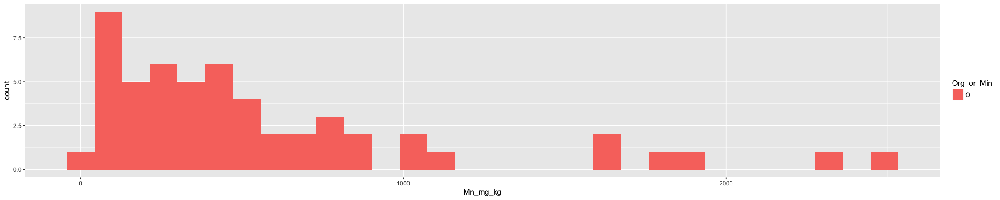

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 4 rows containing non-finite values (stat_bin).”

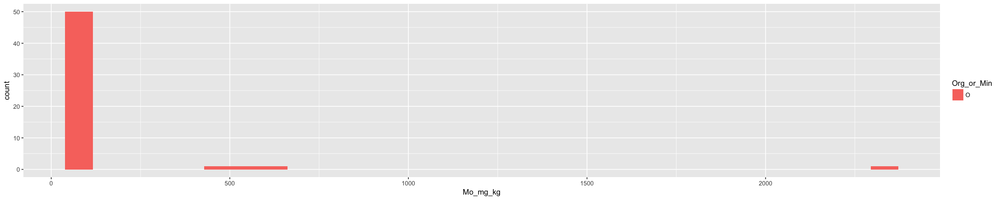

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 4 rows containing non-finite values (stat_bin).”

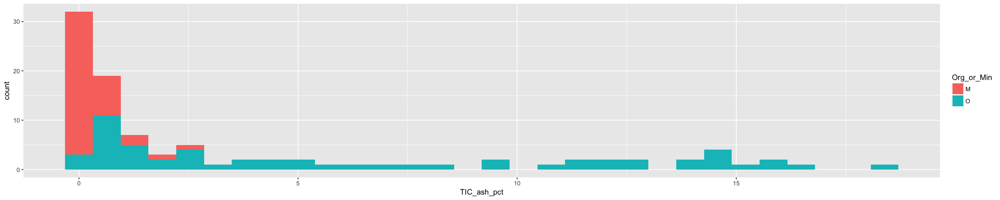

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 41 rows containing non-finite values (stat_bin).”

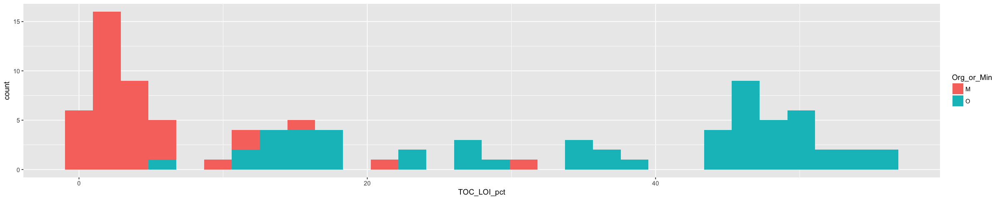

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 7 rows containing non-finite values (stat_bin).”

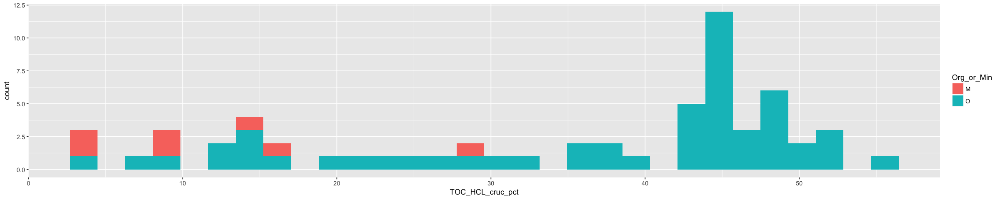

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


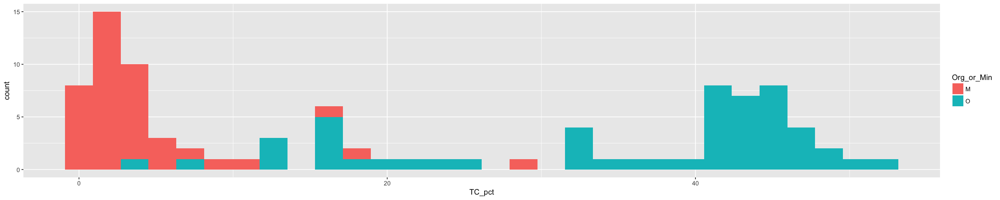

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


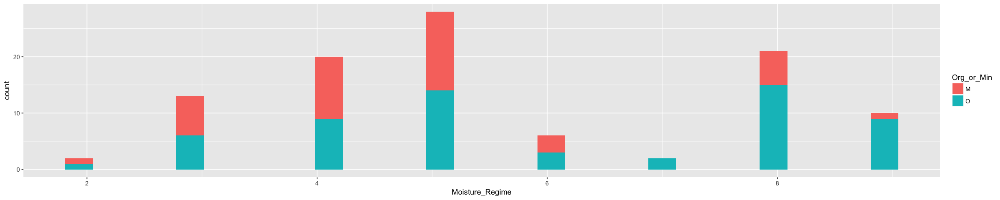

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


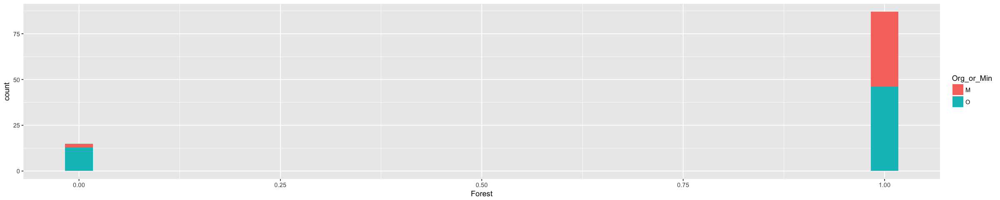

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


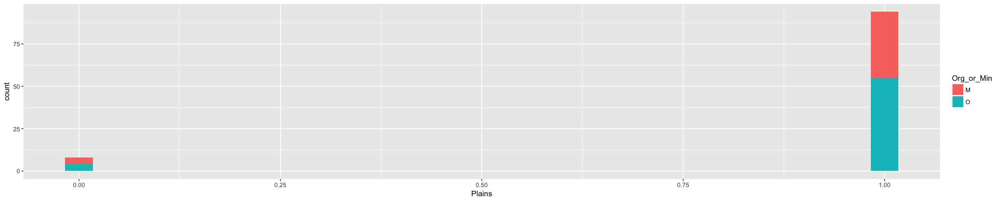

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 5 rows containing non-finite values (stat_bin).”

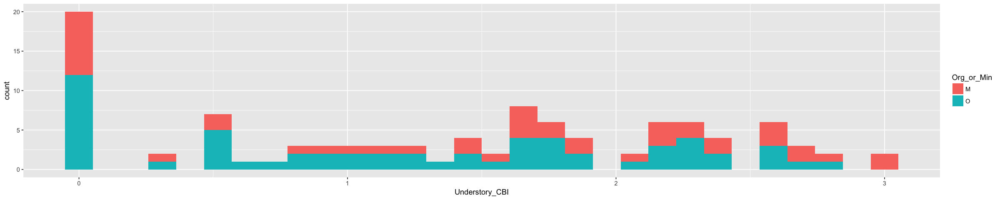

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


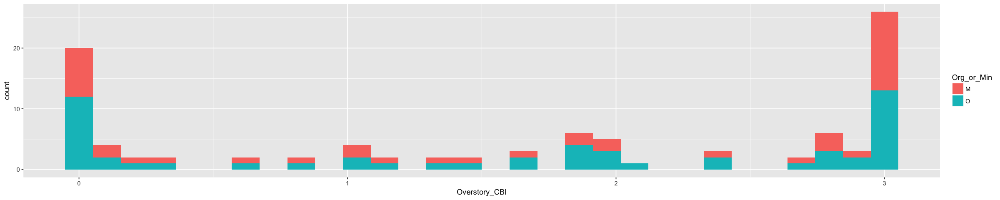

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


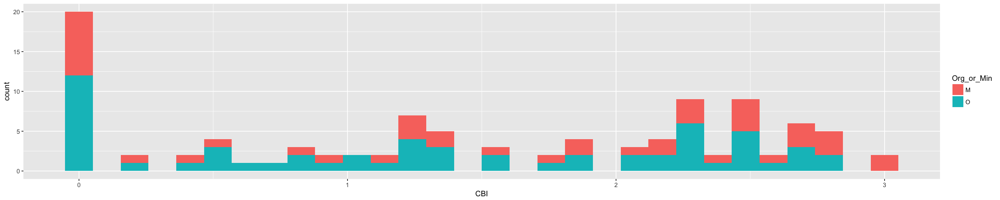

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


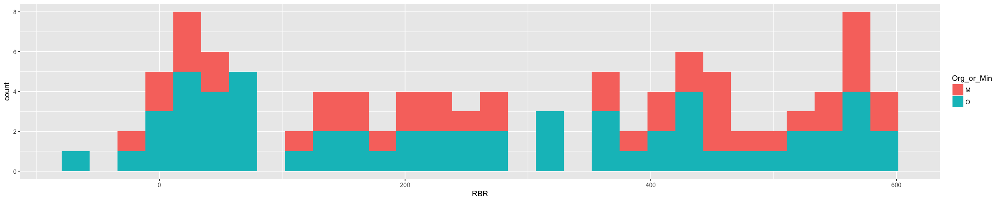

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


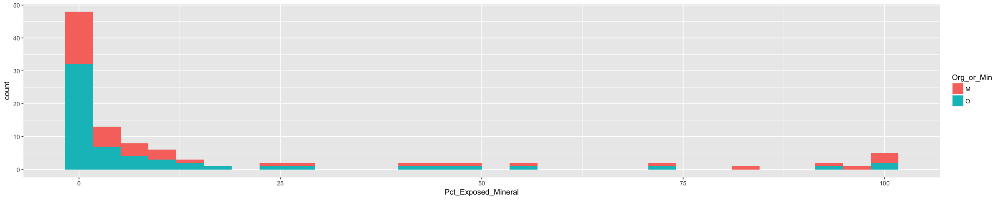

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


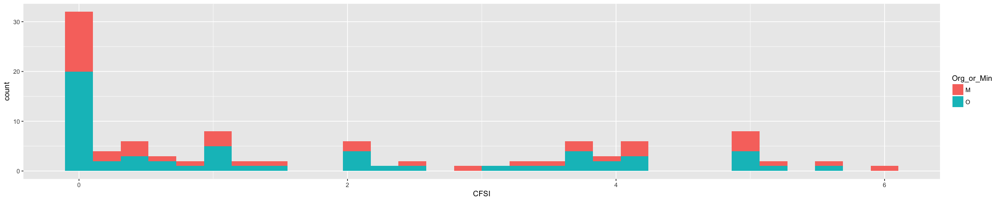

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


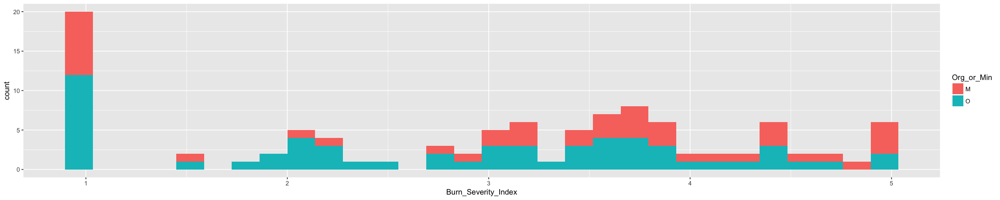

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


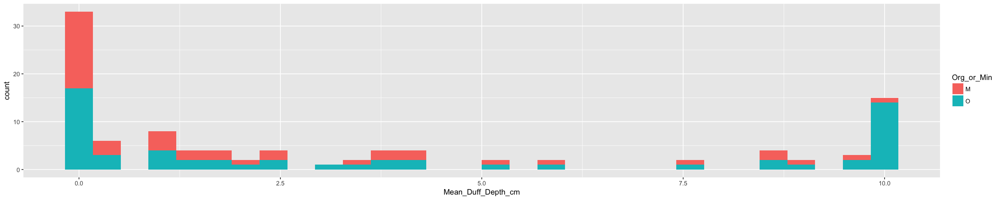

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


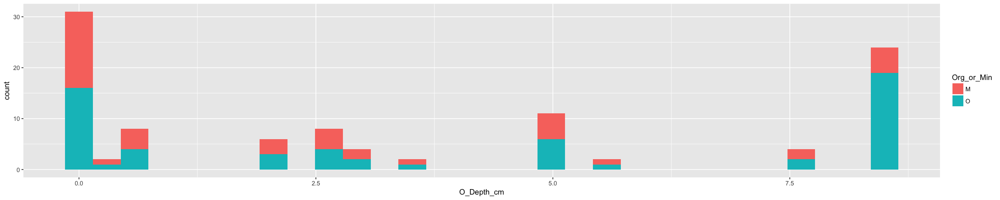

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


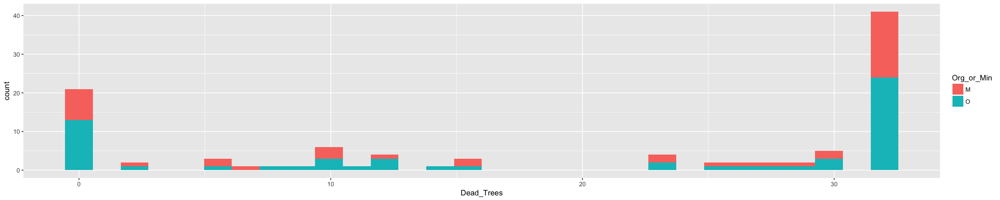

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


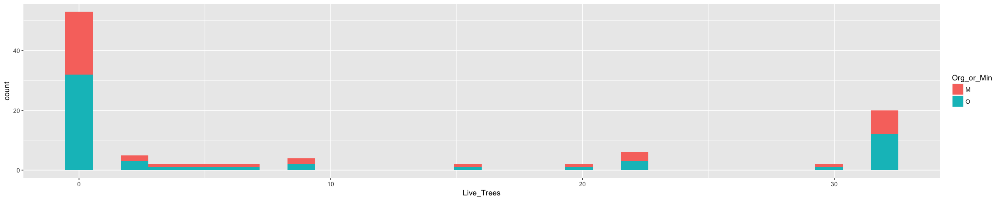

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


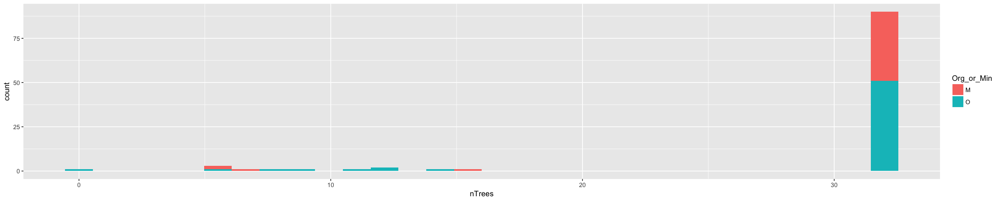

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


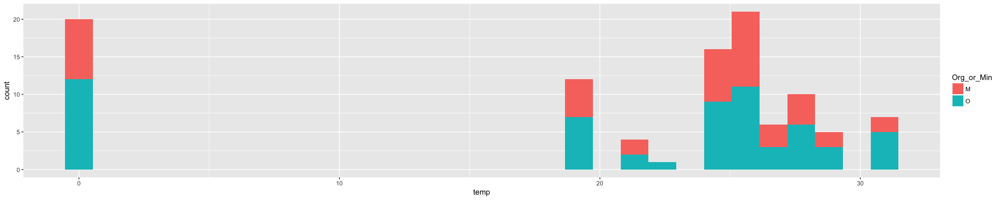

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


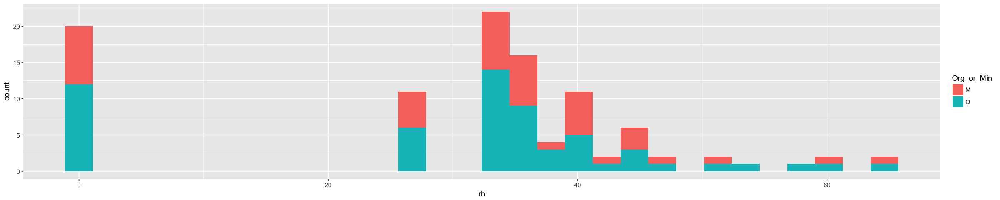

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


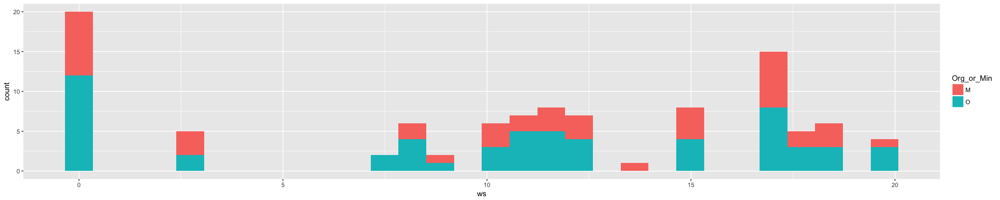

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


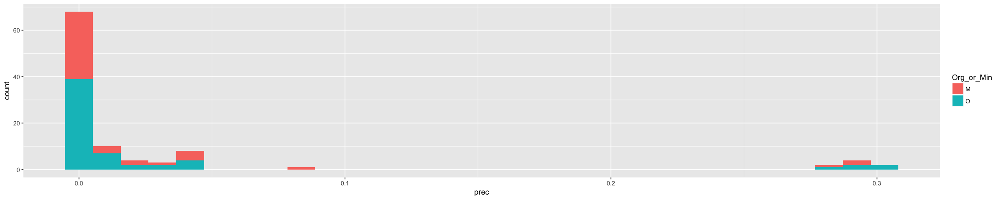

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


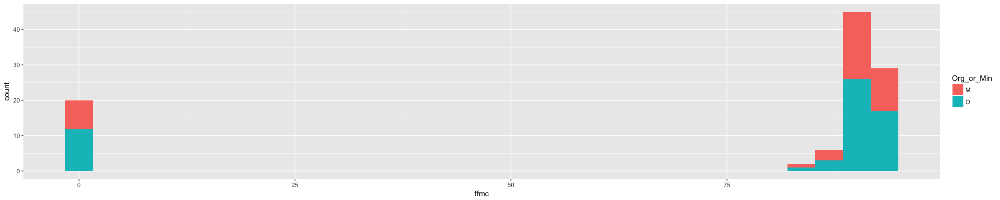

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


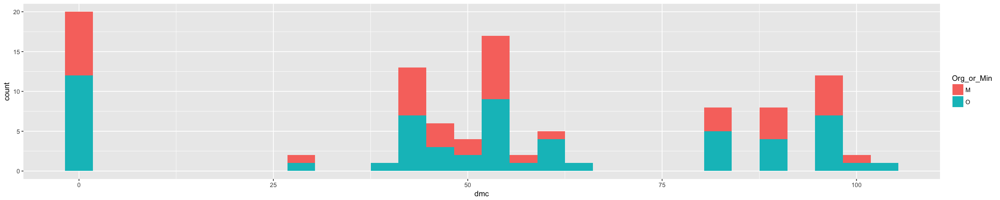

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


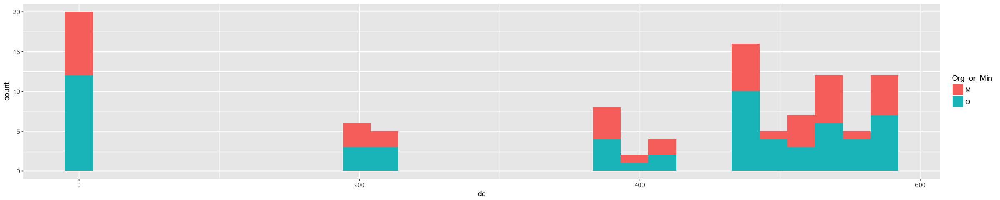

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


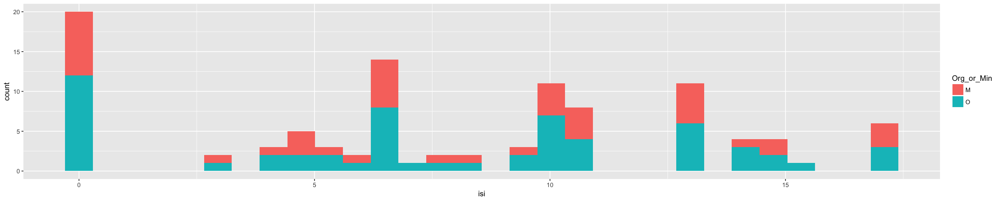

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


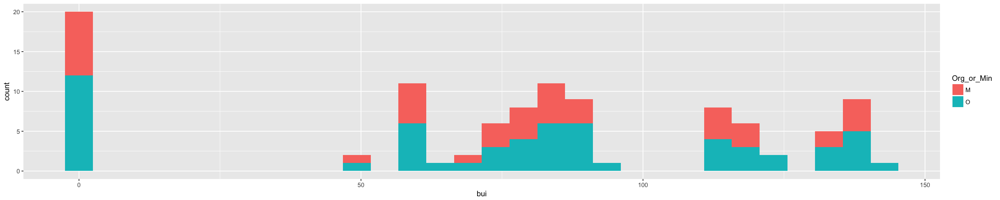

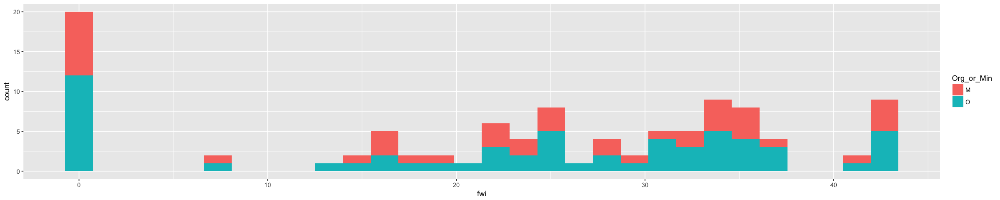

In [39]:
options(repr.plot.width=20, repr.plot.height=4)
for (i in FactorTable[FactorTable$Class=="num","Factors"]){
    SoilsDataPlotterHist(i)
}

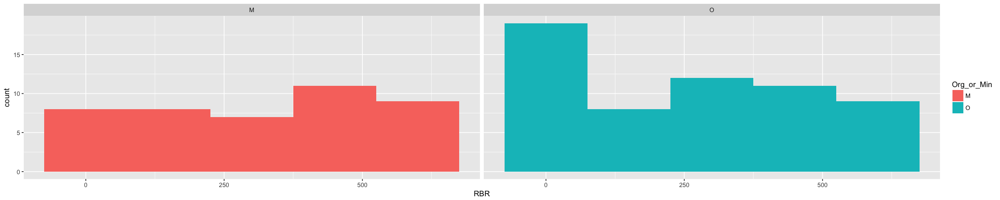

In [51]:
colname="RBR"
df = data.frame(Org_or_Min=df.numeric[,colnames(df.numeric) == "Org_or_Min"],Y=df.numeric[,colnames(df.numeric)==colname])
p = ggplot(df,aes(Y))
p = p + geom_histogram(stat="bin", aes(fill=Org_or_Min), position="stack", binwidth=150)
p = p + xlab(colname)
p = p + facet_wrap(~Org_or_Min)
p